In [1]:
import numpy as np
import pandas as pd

In [11]:
df = pd.read_csv('mobile_prices.csv')
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


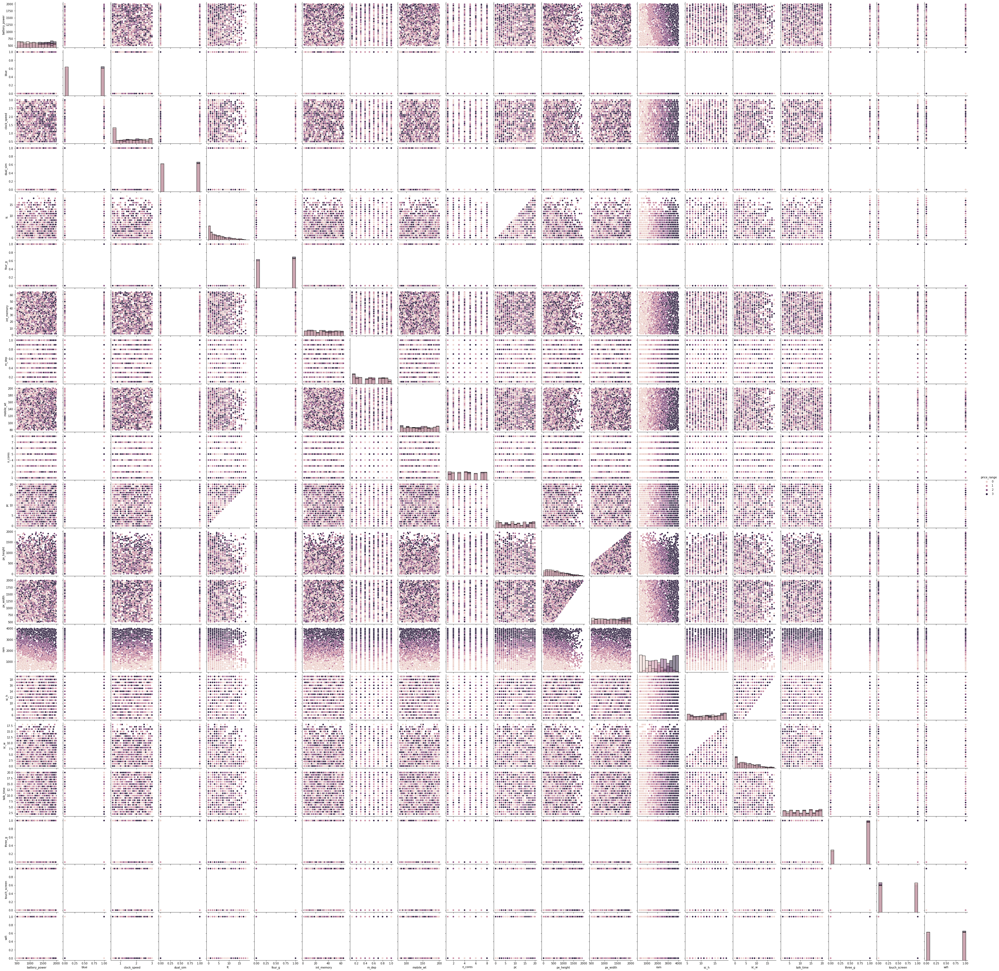

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pairplot to visualize relationships between pairs of features and the target variable
sns.pairplot(df, hue='price_range', diag_kind='hist')
plt.show()


In [14]:
X = df.drop('price_range', axis = 1)
y = df['price_range']

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 45)

In [15]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [16]:
from sklearn.svm import SVC

model = SVC(kernel='rbf', random_state=42)
model.fit(X_train_scaled, y_train)


SVC(random_state=42)

In [17]:
y_pred = model.predict(X_test_scaled)

In [18]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

cm = confusion_matrix(y_test, y_pred)
acc = accuracy_score(y_test, y_pred)
cr = classification_report(y_test, y_pred)


In [19]:
cm

array([[139,  11,   0,   0],
       [  8, 132,  24,   0],
       [  0,  17, 136,  13],
       [  0,   0,   9, 111]], dtype=int64)

In [20]:
acc

0.8633333333333333

In [21]:
print(cr)

              precision    recall  f1-score   support

           0       0.95      0.93      0.94       150
           1       0.82      0.80      0.81       164
           2       0.80      0.82      0.81       166
           3       0.90      0.93      0.91       120

    accuracy                           0.86       600
   macro avg       0.87      0.87      0.87       600
weighted avg       0.86      0.86      0.86       600



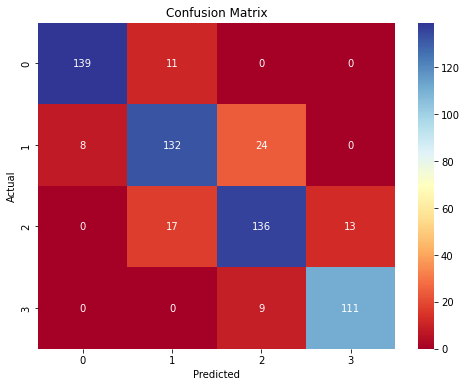

In [22]:
import matplotlib.pyplot as plt 
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='RdYlBu')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()